In [2]:
! pip install wfdb plotly


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import sys
import wfdb
import os
import random
import plotly.graph_objs as go
import plotly.subplots as sp

In [4]:
# Chemin vers la base de données
BASE_PATH = "C:/Users/user/ecg-database1.0.0"
def list_hea_files(base_path):
    hea_paths = []
    for root, dirs, files in os.walk(base_path):
        for file in files:
            if file.endswith(".hea"):
                hea_paths.append(os.path.join(root, file))
    return hea_paths

In [6]:

def load_signal_and_metadata(hea_path, lead="ii"):
    record_path = hea_path.replace(".hea", "")
    record = wfdb.rdrecord(record_path)
    available_leads = [s.lower() for s in record.sig_name]
    if lead.lower() not in available_leads:
        return None, None, None
    idx = available_leads.index(lead.lower())
    signal = record.p_signal[:, idx]
    fs = record.fs

    label = "Unknown"
    with open(hea_path, "r") as f:
        for line in f:
            if line.lower().startswith("# diagnose") or line.lower().startswith("# diagnose:"):
                parts = line.strip().split(":")
                if len(parts) > 1:
                    label = parts[1].strip().lower()
    return signal, fs, label


In [7]:
hea_files = list_hea_files(BASE_PATH)
sampled_files = random.sample(hea_files, 6)

signals = []
labels = []
for path in sampled_files:
    sig, fs, label = load_signal_and_metadata(path)
    if sig is not None:
        signals.append(sig)
        labels.append(label)


In [8]:
fig = sp.make_subplots(rows=3, cols=2, subplot_titles=labels)

for i, sig in enumerate(signals):
    time = np.arange(len(sig)) / fs
    trace = go.Scatter(x=time, y=sig, mode='lines', line=dict(color="black"), name=labels[i])
    row = i // 2 + 1
    col = i % 2 + 1
    fig.add_trace(trace, row=row, col=col)

fig.update_layout(height=800, width=1000, title_text="Visualisation de 6 signaux ECG (lead II)")
fig.update_xaxes(title_text="Temps (s)")
fig.update_yaxes(title_text="Amplitude (mV)")
fig.show()


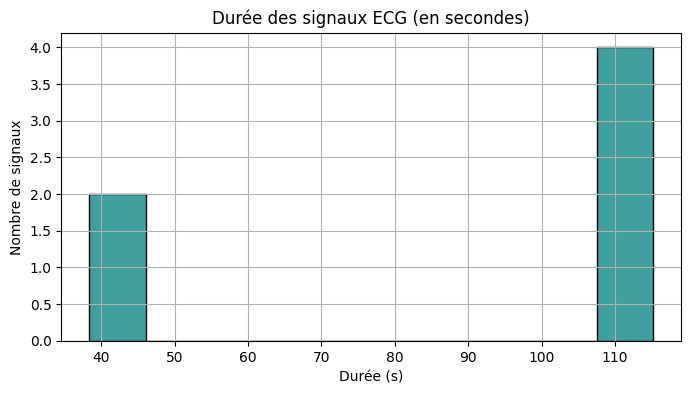

In [9]:
# Longueurs des signaux en secondes
durations_sec = [len(sig)/fs for sig in signals]

plt.figure(figsize=(8, 4))
sns.histplot(durations_sec, bins=10, color='teal')
plt.title("Durée des signaux ECG (en secondes)")
plt.xlabel("Durée (s)")
plt.ylabel("Nombre de signaux")
plt.grid(True)
plt.show()


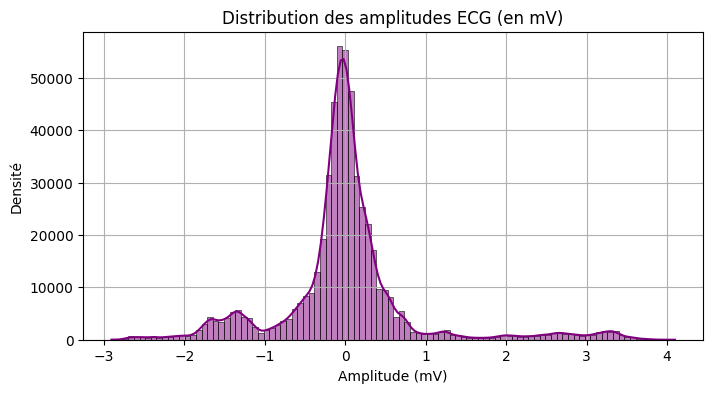

In [10]:
# Concatenation des signaux pour histogramme d'amplitude
all_values = np.concatenate(signals)

plt.figure(figsize=(8, 4))
sns.histplot(all_values, bins=100, kde=True, color='purple')
plt.title("Distribution des amplitudes ECG (en mV)")
plt.xlabel("Amplitude (mV)")
plt.ylabel("Densité")
plt.grid(True)
plt.show()


In [11]:
# Moyenne et écart-type par enregistrement
stats = pd.DataFrame({
    "label": labels,
    "mean_mV": [np.mean(sig) for sig in signals],
    "std_mV": [np.std(sig) for sig in signals],
    "durée_s": [len(sig)/fs for sig in signals]
})
display(stats)


,label,mean_mV,std_mV,durée_s
0,,-0.000018,0.218974,38.4
1,,-0.000202,1.754046,115.2
2,,0.000375,0.429979,115.2
3,,0.000107,0.233187,115.2
4,,-0.000107,0.229394,115.2
5,,0.000016,0.113723,38.4


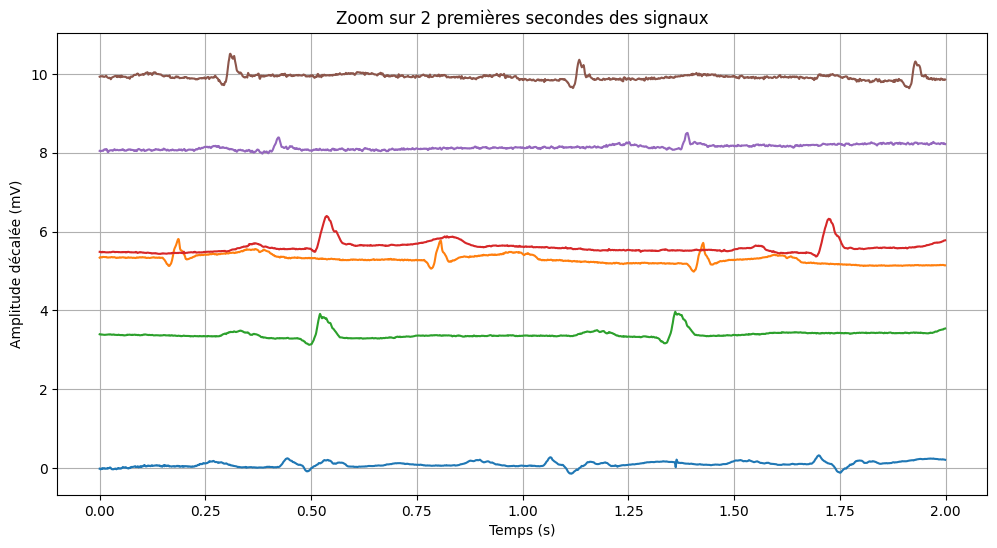

In [12]:
# Zoom sur une petite fenêtre temporelle (~2s)
plt.figure(figsize=(12, 6))
for i, sig in enumerate(signals):
    plt.plot(np.arange(0, 2*fs)/fs, sig[:2*fs] + i*2, label=f"{labels[i]}")

plt.title("Zoom sur 2 premières secondes des signaux")
plt.xlabel("Temps (s)")
plt.ylabel("Amplitude décalée (mV)")
plt.grid(True)
plt.show()


In [13]:
hea_path = r"C:\Users\user\ecg-database1.0.0\patient001\s0014lre.hea"  # adapte le chemin exact si besoin

with open(hea_path, "r", encoding="latin-1") as f:
    for i, line in enumerate(f):
        print(f"{i+1:02d}: {line.strip()}")


01: s0014lre 15 1000 115200
02: s0014lre.dat 16 2000 16 0 -948 -15706 0 i
03: s0014lre.dat 16 2000 16 0 -119 18549 0 ii
04: s0014lre.dat 16 2000 16 0 830 23394 0 iii
05: s0014lre.dat 16 2000 16 0 534 895 0 avr
06: s0014lre.dat 16 2000 16 0 -890 18834 0 avl
07: s0014lre.dat 16 2000 16 0 356 -19541 0 avf
08: s0014lre.dat 16 2000 16 0 2504 9439 0 v1
09: s0014lre.dat 16 2000 16 0 2574 8917 0 v2
10: s0014lre.dat 16 2000 16 0 -1865 11623 0 v3
11: s0014lre.dat 16 2000 16 0 -1644 -8147 0 v4
12: s0014lre.dat 16 2000 16 0 3228 -21698 0 v5
13: s0014lre.dat 16 2000 16 0 3416 -1733 0 v6
14: s0014lre.xyz 16 2000 16 0 1073 11766 0 vx
15: s0014lre.xyz 16 2000 16 0 -2277 -4898 0 vy
16: s0014lre.xyz 16 2000 16 0 1935 27959 0 vz
17: 
18: # age: 81
19: # sex: female
20: # ECG date: 17/10/1990
21: 
22: # Diagnose:
23: # Reason for admission: Myocardial infarction
24: # Acute infarction (localization): infero-latera
25: # Former infarction (localization): no
26: # Additional diagnoses: Diabetes mellitus
27:

In [14]:
def extract_diagnosis_from_hea(hea_path):
    with open(hea_path, "r", encoding='latin-1') as f:
        for line in f:
            if "Reason for admission" in line:
                print(f"Trouvé : {line.strip()}")
                return line.split(":", 1)[1].strip()
    return "Inconnu"

label = extract_diagnosis_from_hea(hea_path)
print("Label extrait :", label)


Trouvé : # Reason for admission: Myocardial infarction
Label extrait : Myocardial infarction


In [15]:
labels = []

# 🛠️ Correction ici : parcours **de tous les sous-dossiers**
for root, dirs, files in os.walk(BASE_PATH):
    for file in files:
        if file.endswith(".hea"):
            hea_path = os.path.join(root, file)
            label = extract_diagnosis_from_hea(hea_path)
            if label:
                labels.append(label)

print(f"Nombre total d’étiquettes collectées : {len(labels)}")

Trouvé : # Reason for admission: Myocardial infarction
Trouvé : # Reason for admission: Myocardial infarction
Trouvé : # Reason for admission: Myocardial infarction
Trouvé : # Reason for admission: Myocardial infarction
Trouvé : # Reason for admission: Myocardial infarction
Trouvé : # Reason for admission: Myocardial infarction
Trouvé : # Reason for admission: Myocardial infarction
Trouvé : # Reason for admission: Myocardial infarction
Trouvé : # Reason for admission: Myocardial infarction
Trouvé : # Reason for admission: Myocardial infarction
Trouvé : # Reason for admission: Myocardial infarction
Trouvé : # Reason for admission: Myocardial infarction
Trouvé : # Reason for admission: Myocardial infarction
Trouvé : # Reason for admission: Myocardial infarction
Trouvé : # Reason for admission: Myocardial infarction
Trouvé : # Reason for admission: Myocardial infarction
Trouvé : # Reason for admission: Myocardial infarction
Trouvé : # Reason for admission: Myocardial infarction
Trouvé : #

In [16]:
from collections import Counter
df_labels = pd.DataFrame(Counter(labels).items(), columns=["Diagnose", "Nombre"])
df_labels = df_labels.sort_values(by="Nombre", ascending=False)

print("Nombre total d’étiquettes collectées :", len(labels))
print(df_labels)


Nombre total d’étiquettes collectées : 549
                  Diagnose  Nombre
0    Myocardial infarction     368
1          Healthy control      80
6                      n/a      27
9           Cardiomyopathy      17
12     Bundle branch block      17
3              Dysrhythmia      16
11             Hypertrophy       7
2   Valvular heart disease       6
14             Myocarditis       4
10           Stable angina       2
4   Heart failure (NYHA 2)       1
5   Heart failure (NYHA 3)       1
7   Heart failure (NYHA 4)       1
8              Palpitation       1
13         Unstable angina       1


C:\Users\user\AppData\Local\Temp\ipykernel_33748\379847201.py:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




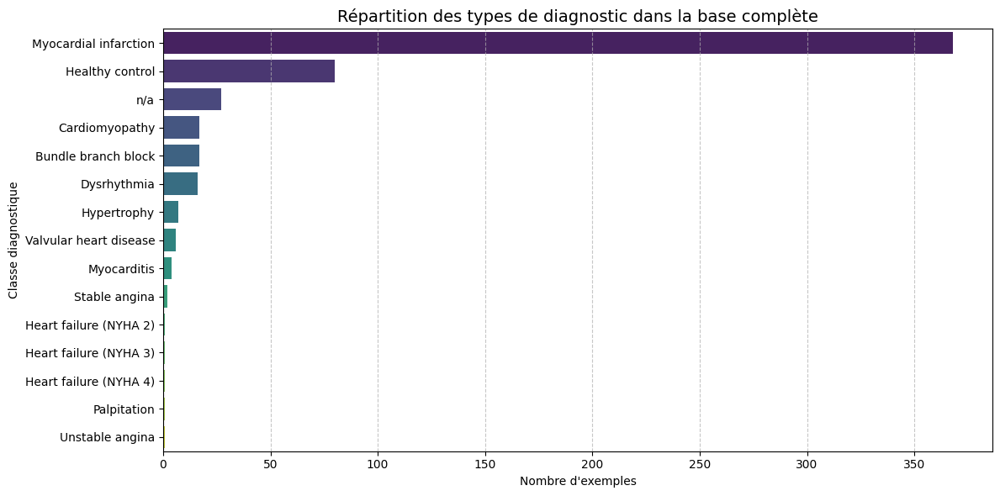

In [17]:
from collections import Counter
df_labels = pd.DataFrame(Counter(labels).items(), columns=["Diagnose", "Nombre"])
df_labels = df_labels.sort_values(by="Nombre", ascending=False)
df_labels.reset_index(drop=True, inplace=True)
df_labels.head()


plt.figure(figsize=(12, 6))
sns.barplot(data=df_labels, x="Nombre", y="Diagnose", palette="viridis")
plt.title("Répartition des types de diagnostic dans la base complète", fontsize=14)
plt.xlabel("Nombre d'exemples")
plt.ylabel("Classe diagnostique")
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [18]:
# Diagnostic regroupés manuellement
regroupements = {
    "Myocardial infarction": "Myocardial infarction",
    "Cardiomyopathy": "Heart failure",
    "Heart failure (NYHA 2)": "Heart failure",
    "Heart failure (NYHA 3)": "Heart failure",
    "Heart failure (NYHA 4)": "Heart failure",
    "Bundle branch block": "Bundle branch block",
    "Dysrhythmia": "Dysrhythmia",
    "Hypertrophy": "Myocardial hypertrophy",
    "Valvular heart disease": "Valvular heart disease",
    "Myocarditis": "Myocarditis",
    "Healthy control": "Healthy control",
    "n/a": "Unknown",
    # On regroupe les autres rares dans "Miscellaneous"
    "Stable angina": "Miscellaneous",
    "Unstable angina": "Miscellaneous",
    "Palpitation": "Miscellaneous",
}

df_labels["ClassGroup"] = df_labels["Diagnose"].map(regroupements).fillna("Miscellaneous")


In [19]:
import pandas as pd
import plotly.express as px
from collections import Counter

# 🧩 La liste complète de labels (un par enregistrement)
# Exemple : labels = ['Myocardial infarction', 'Healthy control', 'Heart failure (NYHA 2)', ...]

# Étape 1 : appliquer les regroupements sur CHAQUE étiquette
labels_grouped = [regroupements.get(label, "Miscellaneous") for label in labels]

# Étape 2 : compter les occurrences
grouped_counter = Counter(labels_grouped)
df_grouped = pd.DataFrame(grouped_counter.items(), columns=["Classe regroupée", "Nombre"])
df_grouped = df_grouped.sort_values(by="Nombre", ascending=False)

# Étape 3 : afficher
fig = px.bar(
    df_grouped,
    x="Nombre",
    y="Classe regroupée",
    orientation="h",
    color="Classe regroupée",
    text="Nombre",
    title="Répartition interactive des classes après regroupement"
)

fig.update_traces(textposition="outside")
fig.update_layout(
    height=600,
    xaxis_title="Nombre d'exemples",
    yaxis_title="Classe diagnostique",
    showlegend=False
)

fig.show()


Encodage des classes

In [20]:
# Appliquer les regroupements manuels sur tout les labesls
labels_grouped = [regroupements.get(label, "Miscellaneous") for label in labels]


In [21]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
df_labels["EncodedClass"] = label_encoder.fit_transform(df_labels["ClassGroup"])
classes = label_encoder.classes_
print("Classes finales :", list(classes))


Classes finales : ['Bundle branch block', 'Dysrhythmia', 'Healthy control', 'Heart failure', 'Miscellaneous', 'Myocardial hypertrophy', 'Myocardial infarction', 'Myocarditis', 'Unknown', 'Valvular heart disease']


In [35]:
from sklearn.preprocessing import LabelEncoder

encoder = LabelEncoder()
y_encoded = encoder.fit_transform(labels_grouped)

# Affichage du mapping
label_mapping = dict(zip(encoder.classes_, encoder.transform(encoder.classes_)))
print("Mapping des classes (texte -> code) avec ordre alphabétique:")
for k, v in label_mapping.items():
    print(f"{k:25} ➝ {v}")

# Vérification distribution
import pandas as pd
print("\nDistribution des classes encodées :")
print(pd.Series(y_encoded).value_counts().sort_index())


Mapping des classes (texte -> code) avec ordre alphabétique:
Bundle branch block       ➝ 0
Dysrhythmia               ➝ 1
Healthy control           ➝ 2
Heart failure             ➝ 3
Miscellaneous             ➝ 4
Myocardial hypertrophy    ➝ 5
Myocardial infarction     ➝ 6
Myocarditis               ➝ 7
Unknown                   ➝ 8
Valvular heart disease    ➝ 9

Distribution des classes encodées :
0     17
1     16
2     80
3     20
4      4
5      7
6    368
7      4
8     27
9      6
Name: count, dtype: int64


In [23]:
print(f"Nombre total d’exemples : {len(labels_grouped)}")


Nombre total d’exemples : 549


In [24]:
# Récupère le chemin absolu du dossier parent (../)
PARENT_DIR = os.path.abspath("..")
if PARENT_DIR not in sys.path:
    sys.path.append(PARENT_DIR)

# importer les modules du dossier Analysis/
from Analysis import preprocessing

X = []
y = []

for patient_dir in sorted(os.listdir(BASE_PATH)):
    patient_path = os.path.join(BASE_PATH, patient_dir)
    if not os.path.isdir(patient_path):
        continue

    hea_files = [f for f in os.listdir(patient_path) if f.endswith(".hea")]
    for hea_file in hea_files:
        record_path = os.path.join(patient_path, hea_file.replace(".hea", ""))
        
        try:
            # Utilise le lead II (recommandé pour l’analyse)
            signal, fs, _ = preprocessing.load_ptb_record(record_path, lead="ii")

            # Raccourcir ou normaliser longueur (ex. : 10 sec à 1000 Hz → 10000)
            if len(signal) >= 10000:
                signal = signal[:10000]
            else:
                continue  # ignorer les signaux trop courts

            # Récupérer l’étiquette
            hea_path = record_path + ".hea"
            raw_label = preprocessing.extract_metadata_from_hea(hea_path).get("Diagnose", "Unknown")
            label = regroupements.get(raw_label, "Miscellaneous")

            X.append(signal)
            y.append(label)

        except Exception as e:
            print(f"Erreur pour {record_path} : {e}")

In [34]:
# Étape 1 : partir de labels_grouped (liste de chaînes déjà regroupées)
labels_grouped = [regroupements.get(label, "Miscellaneous") for label in labels]

# Étape 2 : extraire l’ordre réel des classes (comme affiché dans la visualisation)
ordered_classes = pd.Series(labels_grouped).value_counts().sort_values(ascending=False).index.tolist()

# Étape 3 : construire le mapping texte ➝ code (avec l’ordre réel)
class_to_code = {cls: i for i, cls in enumerate(ordered_classes)}

# Étape 4 : encoder y avec ce mapping personnalisé
y_encoded = np.array([class_to_code[label] for label in labels_grouped])

print("🎯 Mapping (texte ➝ code) avec ordre décroissant :")
for k, v in class_to_code.items():
    print(f"{k:25} ➝ {v}")

print("\n📊 Distribution :")
pd.Series(y_encoded).value_counts().sort_index()


🎯 Mapping (texte ➝ code) avec ordre décroissant :
Myocardial infarction     ➝ 0
Healthy control           ➝ 1
Unknown                   ➝ 2
Heart failure             ➝ 3
Bundle branch block       ➝ 4
Dysrhythmia               ➝ 5
Myocardial hypertrophy    ➝ 6
Valvular heart disease    ➝ 7
Miscellaneous             ➝ 8
Myocarditis               ➝ 9

📊 Distribution :


0    368
1     80
2     27
3     20
4     17
5     16
6      7
7      6
8      4
9      4
Name: count, dtype: int64

In [33]:
X = np.array(X)  # shape : (N, 10000)
y = np.array(y_encoded)

print("X shape :", X.shape)
print("y shape :", y.shape)


X shape : (549, 10000)
y shape : (549,)


In [56]:
from scipy import signal

def preprocess_ecg(raw_signal, fs=1000, lowcut=0.5, highcut=40):
    # Filtrage passe-bande Butterworth
    nyq = 0.5 * fs
    b, a = signal.butter(3, [lowcut/nyq, highcut/nyq], btype='band')
    filtered = signal.filtfilt(b, a, raw_signal)

    # Normalisation Z-score
    normalized = (filtered - np.mean(filtered)) / np.std(filtered)
    return normalized


In [ ]:
def is_noisy(ecg_signal, fs=1000):
    std = np.std(ecg_signal)
    peak_amplitude = np.max(np.abs(ecg_signal))
    is_flat = std < 0.05
    is_extreme = peak_amplitude > 5.0
    return is_flat or is_extreme

In [58]:
X_clean = []
y_clean = []

for xi, yi in zip(X, y_encoded):
    preprocessed = preprocess_ecg(xi, fs=1000)
    if not is_noisy(preprocessed, fs=1000):
        X_clean.append(preprocessed)
        y_clean.append(yi)

X_clean = np.array(X_clean)
y_clean = np.array(y_clean)

print("X_clean shape :", X_clean.shape)
print("y_clean shape :", y_clean.shape)

X_clean shape : (142, 10000)
y_clean shape : (142,)


In [55]:
def segment_signal(signal, window_size=10000, step_size=2500):
    segments = []
    for start in range(0, len(signal) - window_size + 1, step_size):
        end = start + window_size
        segment = signal[start:end]
        segments.append(segment)
    return segments


In [59]:
X_segmented = []
y_segmented = []

for xi, yi in zip(X_clean, y_clean):
    segments = segment_signal(xi, window_size=5000, step_size=2500)
    for seg in segments:
        X_segmented.append(seg)
        y_segmented.append(yi)

X_segmented = np.array(X_segmented)
y_segmented = np.array(y_segmented)

print("X_segmented shape:", X_segmented.shape)  # (n_segments, 5000)
print("y_segmented shape:", y_segmented.shape)


X_segmented shape: (426, 5000)
y_segmented shape: (426,)


Division

In [60]:
import torch
from sklearn.model_selection import train_test_split

# Reshape pour CNN 1D : (N, 1, L)
X_tensor = torch.tensor(X_segmented, dtype=torch.float32).unsqueeze(1)  # (N, 1, 5000)
y_tensor = torch.tensor(y_segmented, dtype=torch.long)  # (N,)

# Split train/test
X_train, X_test, y_train, y_test = train_test_split(X_tensor, y_tensor, test_size=0.2, random_state=42, stratify=y_tensor)


In [61]:
print("X_train shape :", X_train.shape)
print("X_test shape  :", X_test.shape)
print("y_train shape :", y_train.shape)
print("y_test shape  :", y_test.shape)


X_train shape : torch.Size([340, 1, 5000])
X_test shape  : torch.Size([86, 1, 5000])
y_train shape : torch.Size([340])
y_test shape  : torch.Size([86])


In [63]:
# Récupère les classes dans le bon ordre depuis le LabelEncoder
class_mapping = dict(enumerate(encoder.classes_))

# 👇 Appliquer ce mapping aux labels de train/test
train_counts = pd.Series(y_train.numpy()).value_counts(normalize=True).sort_index() * 100
test_counts = pd.Series(y_test.numpy()).value_counts(normalize=True).sort_index() * 100

df_train = pd.DataFrame({
    "Classe": [class_mapping[i] for i in train_counts.index],
    "Proportion (%)": train_counts.values,
    "Set": "Train"
})

df_test = pd.DataFrame({
    "Classe": [class_mapping[i] for i in test_counts.index],
    "Proportion (%)": test_counts.values,
    "Set": "Test"
})

df_all = pd.concat([df_train, df_test])

# 📊 Visualisation interactive (corrigée)
fig = px.bar(
    df_all,
    x="Proportion (%)",
    y="Classe",
    color="Set",
    orientation="h",
    barmode="group",
    text="Proportion (%)",
    title="Distribution des classes dans Train et Test (%)"
)

fig.update_traces(texttemplate='%{text:.2f}%', textposition='outside')
fig.update_layout(height=600, xaxis_title="Pourcentage (%)", yaxis_title="Classe", showlegend=True)
fig.show()


Construction du modéle (CNN+LSTM)

In [65]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class CNN_LSTM_ECG(nn.Module):
    def __init__(self, input_length=10000, num_classes=10):
        super(CNN_LSTM_ECG, self).__init__()
        
        self.cnn = nn.Sequential(
            nn.Conv1d(1, 16, kernel_size=7, stride=1, padding=3),  # (B, 16, L)
            nn.ReLU(),
            nn.MaxPool1d(2),  # (B, 16, L/2)

            nn.Conv1d(16, 32, kernel_size=5, stride=1, padding=2),
            nn.ReLU(),
            nn.MaxPool1d(2),  # (B, 32, L/4)
        )

        self.lstm = nn.LSTM(input_size=32, hidden_size=64, num_layers=1, batch_first=True)

        self.fc = nn.Sequential(
            nn.Linear(64, 64),
            nn.ReLU(),
            nn.Linear(64, num_classes)
        )

    def forward(self, x):
        # x shape : (B, 10000)
        x = x.unsqueeze(1)  # (B, 1, 10000)
        x = self.cnn(x)     # (B, 32, 2500)
        x = x.permute(0, 2, 1)  # (B, 2500, 32) pour LSTM

        _, (h_n, _) = self.lstm(x)  # h_n: (1, B, 64)
        out = h_n.squeeze(0)        # (B, 64)

        return self.fc(out)         # (B, num_classes)


In [66]:
model = CNN_LSTM_ECG(input_length=10000, num_classes=10)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)


In [67]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)


In [68]:
from torch.utils.data import TensorDataset, DataLoader

X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)

train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32)


C:\Users\user\AppData\Local\Temp\ipykernel_33748\3307324166.py:3: UserWarning:

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).

C:\Users\user\AppData\Local\Temp\ipykernel_33748\3307324166.py:4: UserWarning:

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).

C:\Users\user\AppData\Local\Temp\ipykernel_33748\3307324166.py:5: UserWarning:

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).

C:\Users\user\AppData\Local\Temp\ipykernel_33748\3307324166.py:6: UserWarning:

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().require

In [ ]:
num_epochs = 10

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    correct, total = 0, 0

    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        inputs = inputs.unsqueeze(1)  # (B, 1, 10000) pour Conv1d

        optimizer.zero_grad()
        outputs = model(inputs)

        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
    
    acc = 100 * correct / total
    print(f"Epoch [{epoch+1}/{num_epochs}] - Loss: {running_loss:.4f} - Accuracy: {acc:.2f}%")


In [ ]:
model.eval()
correct, total = 0, 0

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        inputs = inputs.unsqueeze(1)

        outputs = model(inputs)
        _, predicted = torch.max(outputs, 1)

        total += labels.size(0)
        correct += (predicted == labels).sum().item()

acc_test = 100 * correct / total
print(f"\n🎯 Accuracy sur le test set : {acc_test:.2f}%")
